In [1]:
import json
import pandas as pd
from src.main.imu_data_io import load_raw_sensor_data, save_data
from src.main.imu_preprocessing import sync, resample, remove_gravity, combine_sensor_data
from src.main.imu_preprocessing import median_filter, align_old_msft_watch, transform_data
from src.utils.imu_data_visualization import plot_raw_sensor

In [2]:
with open('../../config/imu_config.json') as config_file:
    config = json.load(config_file)
upsample_frequency = config['resampling']['upsample_frequency']

In [3]:
def process_data(data, steps, plot_each_step=False):
    for i, step in enumerate(steps):
        data = step(*data)
        # if plot_each_step:
        #     plot_raw_sensor(data, title=f'Step {i+1}: {step.__name__}')
    return data

In [4]:
steps = [
    lambda acc, gyro: sync(acc, gyro),
    lambda acc, gyro: resample(acc, gyro, 100),
    lambda acc, gyro: (remove_gravity(acc, upsample_frequency), gyro),
    lambda acc, gyro: median_filter(acc, gyro),
    lambda acc, gyro: align_old_msft_watch(acc, gyro),
    lambda acc, gyro: transform_data(acc, gyro)
]

In [5]:
acc_data, gyro_data = load_raw_sensor_data('../../data/raw/5')

In [6]:
acc_processed, gyro_processed = process_data((acc_data, gyro_data), steps, True)


In [7]:
R = combine_sensor_data(acc_processed, gyro_processed)

In [8]:
save_data(R, '..', 'R5', 'pickle')

In [70]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

def plot_imu_comparison(raw_data, processed_data, save_path_prefix=None, fig_size=(12, 8), dpi=300):
    """
    Δημιουργεί δύο γραφήματα υψηλής ποιότητας για σύγκριση ακατέργαστων και 
    επεξεργασμένων δεδομένων επιταχυνσιόμετρου και γυροσκοπίου.
    """
    plt.style.use('seaborn-v0_8-paper')
    colors = ['#2ecc71', '#e74c3c', '#3498db']
    axes_labels = ['x', 'y', 'z']
    
    # Convert timestamps to minutes from start
    raw_acc, raw_gyro = raw_data
    proc_acc, proc_gyro = processed_data
    
    def convert_to_minutes(time_series):
        return (time_series - time_series.iloc[0]).dt.total_seconds() / 60
    
    # Create time arrays
    raw_acc_time = convert_to_minutes(raw_acc['time'])
    proc_acc_time = convert_to_minutes(proc_acc['time'])
    raw_gyro_time = convert_to_minutes(raw_gyro['time'])
    proc_gyro_time = convert_to_minutes(proc_gyro['time'])
    
    # Calculate maximum time for x-axis limits
    acc_time_max = max(raw_acc_time.max(), proc_acc_time.max())
    gyro_time_max = max(raw_gyro_time.max(), proc_gyro_time.max())
    
    # Create accelerometer figure with adjusted height ratios for main title
    fig_acc = plt.figure(figsize=fig_size, dpi=dpi)
    gs_acc = fig_acc.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax1 = fig_acc.add_subplot(gs_acc[0])
    ax2 = fig_acc.add_subplot(gs_acc[1], sharex=ax1)
    
    # Plot accelerometer data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax1.plot(raw_acc_time, raw_acc[dim], 
                color=color, label=f'a_{label}')
        ax2.plot(proc_acc_time, proc_acc[dim], 
                color=color, label=f'a_{label}')
    
    # Create gyroscope figure with adjusted height ratios for main title
    fig_gyro = plt.figure(figsize=fig_size, dpi=dpi)
    gs_gyro = fig_gyro.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax3 = fig_gyro.add_subplot(gs_gyro[0])
    ax4 = fig_gyro.add_subplot(gs_gyro[1], sharex=ax3)
    
    # Plot gyroscope data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax3.plot(raw_gyro_time, raw_gyro[dim],
                color=color, label=f'g_{label}')
        ax4.plot(proc_gyro_time, proc_gyro[dim],
                color=color, label=f'g_{label}')
    
    # Style settings for both figures
    for ax in [ax1, ax2, ax3, ax4]:
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend(frameon=True, fancybox=True, framealpha=0.9,
                 loc='center left', bbox_to_anchor=(1.02, 0.5),
                 fontsize=10)
    
    # Hide x-labels and ticks for top subplots
    ax1.tick_params(labelbottom=False)
    ax3.tick_params(labelbottom=False)
    
    # Set x-axis limits and ticks for accelerometer
    for ax in [ax1, ax2]:
        ax.set_xlim(0, acc_time_max)
        ax.set_xticks(np.arange(0, acc_time_max + 1, 5))
    
    # Set x-axis limits and ticks for gyroscope
    for ax in [ax3, ax4]:
        ax.set_xlim(0, gyro_time_max)
        ax.set_xticks(np.arange(0, gyro_time_max + 1, 5))
    
    # Set specific labels and titles for accelerometer
    fig_acc.suptitle('Επίδραση Προεπεξεργασίας στα Δεδομένα Επιταχυνσιόμετρου', 
                     fontsize=15, fontweight='bold', y=0.95)
    ax1.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=11)
    ax2.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=11)
    ax1.set_ylabel('Επιτάχυνση (m/s²)')
    ax2.set_ylabel('Επιτάχυνση (m/s²)')
    ax2.set_xlabel('Χρόνος (λεπτά)')
    
    # Set specific labels and titles for gyroscope
    fig_gyro.suptitle('Επίδραση Προεπεξεργασίας στα Δεδομένα Γυροσκοπίου', 
                      fontsize=15, fontweight='bold', y=0.95)
    ax3.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=11)
    ax4.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=11)
    ax3.set_ylabel('Γωνιακή Ταχύτητα (rad/s)')
    ax4.set_ylabel('Γωνιακή Ταχύτητα (rad/s)')
    ax4.set_xlabel('Χρόνος (λεπτά)')
    
   # Add processing information to accelerometer figure
    fig_acc.text(0.02, 0.02, 
        'Συχνότητα δειγματοληψίας: 100 Hz\n'
        'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Αφαίρεση βαρύτητας, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
        fontsize=8, style='italic', bbox=dict(facecolor='white', alpha=0.8))
    
    # Add processing information to gyroscope figure
    fig_gyro.text(0.02, 0.02, 
        'Συχνότητα δειγματοληψίας: 100 Hz\n'
        'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
        fontsize=8, style='italic', bbox=dict(facecolor='white', alpha=0.8))
    
    # Adjust layout while preserving spacing
    fig_acc.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig_gyro.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save figures if path provided
    if save_path_prefix:
        fig_acc.savefig(f'{save_path_prefix}_accelerometer.pdf', 
                       bbox_inches='tight', dpi=dpi)
        fig_gyro.savefig(f'{save_path_prefix}_gyroscope.pdf', 
                        bbox_inches='tight', dpi=dpi)
        
    return fig_acc, fig_gyro

/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_46753/3669275359.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_acc.tight_layout(rect=[0, 0.03, 1, 0.95])
/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_46753/3669275359.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_gyro.tight_layout(rect=[0, 0.03, 1, 0.95])


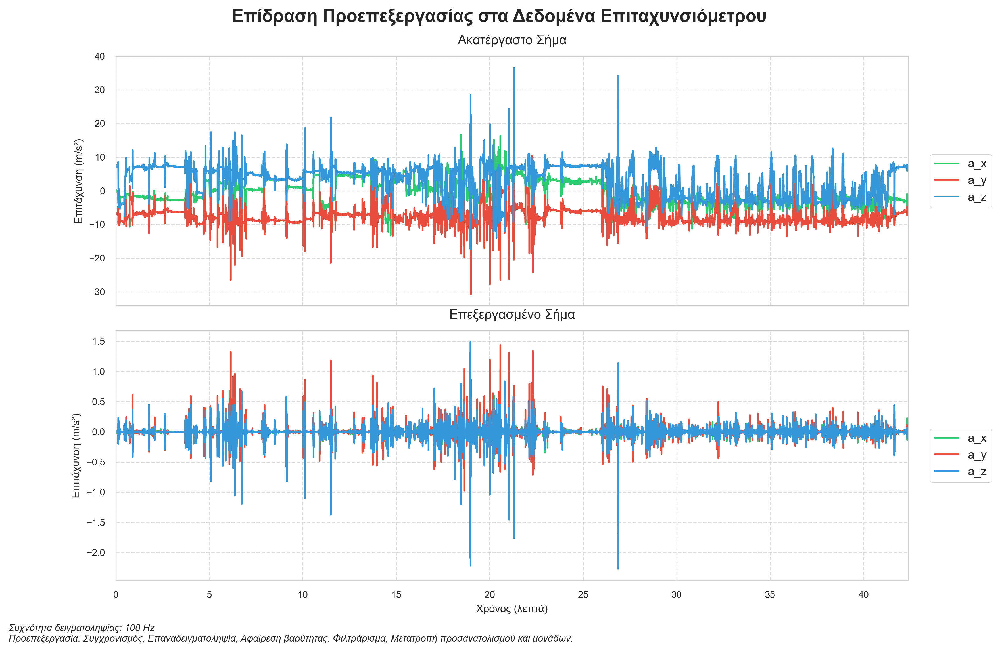

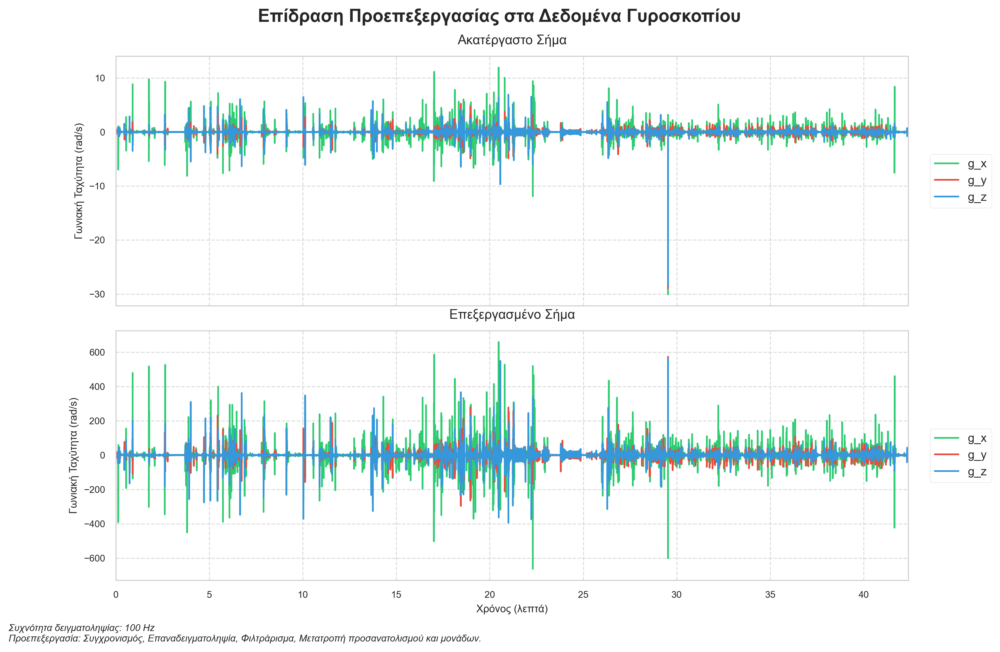

In [71]:
fig = plot_imu_comparison(
    (acc_data, gyro_data),
    (acc_processed, gyro_processed)
)

In [80]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
path_to_save = '../../notebooks/data_specs/plots/5_preprocessing_before_after_zoom'
def plot_imu_comparison_zoom_gpt(raw_data, processed_data, save_path_prefix=path_to_save, fig_size=(20, 12), dpi=600):
    """
    Δημιουργεί δύο γραφήματα υψηλής ποιότητας για σύγκριση ακατέργαστων και 
    επεξεργασμένων δεδομένων επιταχυνσιόμετρου και γυροσκοπίου, με ζουμαρισμένη περιοχή.
    """
    plt.style.use('seaborn-v0_8-paper')
    colors = ['#2ecc71', '#e74c3c', '#3498db']
    axes_labels = ['x', 'y', 'z']
    
    # Convert timestamps to minutes from start
    raw_acc, raw_gyro = raw_data
    proc_acc, proc_gyro = processed_data
    
    def convert_to_minutes(time_series):
        return (time_series - time_series.iloc[0]).dt.total_seconds() / 60
    
    # Create time arrays
    raw_acc_time = convert_to_minutes(raw_acc['time'])
    proc_acc_time = convert_to_minutes(proc_acc['time'])
    raw_gyro_time = convert_to_minutes(raw_gyro['time'])
    proc_gyro_time = convert_to_minutes(proc_gyro['time'])
    
    # Calculate maximum time for x-axis limits
    acc_time_max = max(raw_acc_time.max(), proc_acc_time.max())
    gyro_time_max = max(raw_gyro_time.max(), proc_gyro_time.max())
    
    # Define zoom area (from minute 26.8 to 26.9)
    zoom_start = 26.830  # in minutes
    zoom_end = 26.895    # in minutes
    
    # Create accelerometer figure
    fig_acc = plt.figure(figsize=fig_size, dpi=dpi)
    gs_acc = fig_acc.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax1 = fig_acc.add_subplot(gs_acc[0])
    ax2 = fig_acc.add_subplot(gs_acc[1], sharex=ax1)
    
    # Plot accelerometer data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax1.plot(raw_acc_time, raw_acc[dim], 
                color=color, label=f'a_{label}')
        ax2.plot(proc_acc_time, proc_acc[dim], 
                color=color, label=f'a_{label}')
    
    # Create gyroscope figure
    fig_gyro = plt.figure(figsize=fig_size, dpi=dpi)
    gs_gyro = fig_gyro.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax3 = fig_gyro.add_subplot(gs_gyro[0])
    ax4 = fig_gyro.add_subplot(gs_gyro[1], sharex=ax3)
    
    # Plot gyroscope data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax3.plot(raw_gyro_time, raw_gyro[dim],
                color=color, label=f'g_{label}')
        ax4.plot(proc_gyro_time, proc_gyro[dim],
                color=color, label=f'g_{label}')
    
    # Style settings for both figures
    for ax in [ax1, ax2, ax3, ax4]:
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend(frameon=True, fancybox=True, framealpha=0.9,
                 loc='center left', bbox_to_anchor=(1.02, 0.5),
                 fontsize=10)
    
    # Hide x-labels and ticks for top subplots
    ax1.tick_params(labelbottom=False)
    ax3.tick_params(labelbottom=False)
    
    # Set x-axis limits and ticks for accelerometer
    for ax in [ax1, ax2]:
        ax.set_xlim(0, acc_time_max)
        ax.set_xticks(np.arange(0, acc_time_max + 1, 5))
    
    # Set x-axis limits and ticks for gyroscope
    for ax in [ax3, ax4]:
        ax.set_xlim(0, gyro_time_max)
        ax.set_xticks(np.arange(0, gyro_time_max + 1, 5))
    
    # Set specific labels and titles for accelerometer
    fig_acc.suptitle('Επίδραση Προεπεξεργασίας στο Σήμα Επιταχυνσιόμετρου', 
                     fontsize=15, fontweight='bold', y=0.95)
    ax1.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=11)
    ax2.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=11)
    ax1.set_ylabel('Επιτάχυνση (m/s²)')
    ax2.set_ylabel('Επιτάχυνση (m/s²)')
    ax2.set_xlabel('Χρόνος (λεπτά)')
    
    # Set specific labels and titles for gyroscope
    fig_gyro.suptitle('Επίδραση Προεπεξεργασίας στο Σήμα Γυροσκοπίου', 
                      fontsize=15, fontweight='bold', y=0.95)
    ax3.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=11)
    ax4.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=11)
    ax3.set_ylabel('Γωνιακή Ταχύτητα (rad/s)')
    ax4.set_ylabel('Γωνιακή Ταχύτητα (rad/s)')
    ax4.set_xlabel('Χρόνος (λεπτά)')
    
    # Add processing information to accelerometer figure
    fig_acc.text(0.02, 0.02, 
        'Συχνότητα δειγματοληψίας: 100 Hz\n'
        'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Αφαίρεση βαρύτητας, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
        fontsize=8, style='italic', bbox=dict(facecolor='white', alpha=0.8))
    
    # Add processing information to gyroscope figure
    fig_gyro.text(0.02, 0.02, 
        'Συχνότητα δειγματοληψίας: 100 Hz\n'
        'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
        fontsize=8, style='italic', bbox=dict(facecolor='white', alpha=0.8))
    
    # Adjust the inset parameters
    inset_width = "25%"   # Make the zoomed window smaller
    inset_height = "25%"
    inset_loc = 4         # Move inset to bottom right (loc=4)
    
    # Add zoomed-in insets for accelerometer plots
    for ax_main, time_data, data, label in [
        (ax1, raw_acc_time, raw_acc, 'raw'),
        (ax2, proc_acc_time, proc_acc, 'processed'),
    ]:
        # Create inset axes
        axins = inset_axes(ax_main, width=inset_width, height=inset_height, loc=inset_loc, borderpad=1)
        # Plot zoomed-in data
        for dim, color in zip(['x', 'y', 'z'], colors):
            axins.plot(time_data, data[dim], color=color)
        # Set limits to zoom area
        axins.set_xlim(zoom_start, zoom_end)
        y_min = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x','y','z']].min().min()
        y_max = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x','y','z']].max().max()
        axins.set_ylim(y_min, y_max)
        # Remove ticks
        axins.set_xticks([])
        axins.set_yticks([])
        # Enhance rectangle on main plot and add connecting lines
        mark_inset(ax_main, axins, loc1=2, loc2=4, fc="none", ec="0.5")
    
    # Add zoomed-in insets for gyroscope plots
    for ax_main, time_data, data, label in [
        (ax3, raw_gyro_time, raw_gyro, 'raw'),
        (ax4, proc_gyro_time, proc_gyro, 'processed'),
    ]:
        # Create inset axes
        axins = inset_axes(ax_main, width=inset_width, height=inset_height, loc=inset_loc, borderpad=1)
        # Plot zoomed-in data
        for dim, color in zip(['x', 'y', 'z'], colors):
            axins.plot(time_data, data[dim], color=color)
        # Set limits to zoom area
        axins.set_xlim(zoom_start, zoom_end)
        y_min = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x','y','z']].min().min()
        y_max = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x','y','z']].max().max()
        axins.set_ylim(y_min, y_max)
        # Remove ticks
        axins.set_xticks([])
        axins.set_yticks([])
        # Enhance rectangle on main plot and add connecting lines
        mark_inset(ax_main, axins, loc1=2, loc2=4, fc="none", ec="0.5")
    
    # Adjust layout while preserving spacing
    fig_acc.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig_gyro.tight_layout(rect=[0, 0.03, 1, 0.95])
    
    # Save figures if path provided
    if save_path_prefix:
        fig_acc.savefig(f'{save_path_prefix}_accelerometer.png', 
                       bbox_inches='tight', dpi=dpi)
        fig_gyro.savefig(f'{save_path_prefix}_gyroscope.png', 
                        bbox_inches='tight', dpi=dpi)
        
    return fig_acc, fig_gyro

# Example usage:
# fig_acc, fig_gyro = plot_imu_comparison(
#     (raw_acc_data, raw_gyro_data),
#     (processed_acc_data, processed_gyro_data),
#     save_path_prefix='imu_comparison'
# )


In [81]:
fig = plot_imu_comparison_zoom_gpt(
    (acc_data, gyro_data),
    (acc_processed, gyro_processed)
)

/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_46753/2300040843.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_acc.tight_layout(rect=[0, 0.03, 1, 0.95])
/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_46753/2300040843.py:162: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_gyro.tight_layout(rect=[0, 0.03, 1, 0.95])


# test to improve

In [19]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

path_to_save = '../../notebooks/data_specs/plots/UPDATED_5_preprocessing_before_after_zoom'


def plot_imu_comparison_zoom_gpt(raw_data, processed_data, save_path_prefix=path_to_save, fig_size=(20, 12), dpi=600):
    """
    Δημιουργεί δύο γραφήματα υψηλής ποιότητας για σύγκριση ακατέργαστων και 
    επεξεργασμένων δεδομένων επιταχυνσιόμετρου και γυροσκοπίου, με ζουμαρισμένη περιοχή.
    """
    plt.style.use('seaborn-v0_8-paper')
    colors = ['#2ecc71', '#e74c3c', '#3498db']
    axes_labels = ['x', 'y', 'z']

    # Convert timestamps to minutes from start
    raw_acc, raw_gyro = raw_data
    proc_acc, proc_gyro = processed_data

    def convert_to_minutes(time_series):
        return (time_series - time_series.iloc[0]).dt.total_seconds() / 60

    # Create time arrays
    raw_acc_time = convert_to_minutes(raw_acc['time'])
    proc_acc_time = convert_to_minutes(proc_acc['time'])
    raw_gyro_time = convert_to_minutes(raw_gyro['time'])
    proc_gyro_time = convert_to_minutes(proc_gyro['time'])

    # Calculate maximum time for x-axis limits
    acc_time_max = max(raw_acc_time.max(), proc_acc_time.max())
    gyro_time_max = max(raw_gyro_time.max(), proc_gyro_time.max())

    # Define zoom area (from minute 26.8 to 26.9)
    zoom_start = 26.830  # in minutes
    zoom_end = 26.895  # in minutes

    # Create accelerometer figure
    fig_acc = plt.figure(figsize=fig_size, dpi=dpi)
    gs_acc = fig_acc.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax1 = fig_acc.add_subplot(gs_acc[0])
    ax2 = fig_acc.add_subplot(gs_acc[1], sharex=ax1)
    
    # fig_acc.set_constrained_layout(True)

    # Plot accelerometer data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax1.plot(raw_acc_time, raw_acc[dim],
                 color=color, label=f'a_{label}')
        ax2.plot(proc_acc_time, proc_acc[dim],
                 color=color, label=f'a_{label}')

    # Create gyroscope figure
    fig_gyro = plt.figure(figsize=fig_size, dpi=dpi)
    gs_gyro = fig_gyro.add_gridspec(2, 1, height_ratios=[1, 1], hspace=0.1)
    ax3 = fig_gyro.add_subplot(gs_gyro[0])
    ax4 = fig_gyro.add_subplot(gs_gyro[1], sharex=ax3)
    # fig_gyro.set_constrained_layout(True)

    # Plot gyroscope data
    for dim, color, label in zip(['x', 'y', 'z'], colors, axes_labels):
        ax3.plot(raw_gyro_time, raw_gyro[dim],
                 color=color, label=f'g_{label}')
        ax4.plot(proc_gyro_time, proc_gyro[dim],
                 color=color, label=f'g_{label}')

    # Style settings for both figures
    for ax in [ax1, ax2, ax3, ax4]:
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend(frameon=True, fancybox=True, framealpha=0.9,
                  loc='upper right', fontsize=10)

    # Hide x-labels and ticks for top subplots
    ax1.tick_params(labelbottom=False)
    ax3.tick_params(labelbottom=False)

    # Set x-axis limits and ticks for accelerometer
    for ax in [ax1, ax2]:
        ax.set_xlim(0, acc_time_max)
        ax.set_xticks(np.arange(0, acc_time_max + 1, 5))

    # Set x-axis limits and ticks for gyroscope
    for ax in [ax3, ax4]:
        ax.set_xlim(0, gyro_time_max)
        ax.set_xticks(np.arange(0, gyro_time_max + 1, 5))

    # Set specific labels and titles for accelerometer
    fig_acc.suptitle('Επίδραση Προεπεξεργασίας στο Σήμα Επιταχυνσιόμετρου',
                     fontsize=18, fontweight='bold', y=0.95)
    ax1.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=14)
    ax2.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=14)
    ax1.set_ylabel('Επιτάχυνση (m/s²)', fontsize=12)
    ax2.set_ylabel('Επιτάχυνση (m/s²)', fontsize=12)
    ax2.set_xlabel('Χρόνος (λεπτά)', fontsize=12)

    # Set specific labels and titles for gyroscope
    fig_gyro.suptitle('Επίδραση Προεπεξεργασίας στο Σήμα Γυροσκοπίου',
                      fontsize=18, fontweight='bold', y=0.95)
    ax3.set_title('Ακατέργαστο Σήμα', pad=10, fontsize=14)
    ax4.set_title('Επεξεργασμένο Σήμα', pad=10, fontsize=14)
    ax3.set_ylabel('Γωνιακή Ταχύτητα (rad/s)', fontsize=12)
    ax4.set_ylabel('Γωνιακή Ταχύτητα (rad/s)', fontsize=12)
    ax4.set_xlabel('Χρόνος (λεπτά)', fontsize=12)

    # Add processing information to accelerometer figure
    # fig_acc.text(0.02, 0.02,
    #              'Συχνότητα δειγματοληψίας: 100 Hz\n'
    #              'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Αφαίρεση βαρύτητας, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
    #              fontsize=12, style='italic', bbox=dict(facecolor='white', alpha=0.8))
    # 
    # # Add processing information to gyroscope figure
    # fig_gyro.text(0.02, 0.02,
    #               'Συχνότητα δειγματοληψίας: 100 Hz\n'
    #               'Προεπεξεργασία: Συγχρονισμός, Επαναδειγματοληψία, Φιλτράρισμα, Μετατροπή προσανατολισμού και μονάδων.',
    #               fontsize=12, style='italic', bbox=dict(facecolor='white', alpha=0.8))

    # Adjust the inset parameters
    inset_width = "25%"  # Make the zoomed window smaller
    inset_height = "25%"
    inset_loc = 4  # Move inset to bottom right (loc=4)

    # Add zoomed-in insets for accelerometer plots
    for ax_main, time_data, data, label in [
        (ax1, raw_acc_time, raw_acc, 'raw'),
        (ax2, proc_acc_time, proc_acc, 'processed'),
    ]:
        # Create inset axes
        axins = inset_axes(ax_main, width=inset_width, height=inset_height, loc=inset_loc, borderpad=1)
        # Plot zoomed-in data
        for dim, color in zip(['x', 'y', 'z'], colors):
            axins.plot(time_data, data[dim], color=color)
        # Set limits to zoom area
        axins.set_xlim(zoom_start, zoom_end)
        y_min = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x', 'y', 'z']].min().min()
        y_max = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x', 'y', 'z']].max().max()
        axins.set_ylim(y_min, y_max)
        # Remove ticks
        axins.set_xticks([])
        axins.set_yticks([])
        # Enhance rectangle on main plot and add connecting lines
        mark_inset(ax_main, axins, loc1=2, loc2=4, fc="none", ec="0.5")

    # Add zoomed-in insets for gyroscope plots
    for ax_main, time_data, data, label in [
        (ax3, raw_gyro_time, raw_gyro, 'raw'),
        (ax4, proc_gyro_time, proc_gyro, 'processed'),
    ]:
        # Create inset axes
        axins = inset_axes(ax_main, width=inset_width, height=inset_height, loc=inset_loc, borderpad=1)
        # Plot zoomed-in data
        for dim, color in zip(['x', 'y', 'z'], colors):
            axins.plot(time_data, data[dim], color=color)
        # Set limits to zoom area
        axins.set_xlim(zoom_start, zoom_end)
        y_min = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x', 'y', 'z']].min().min()
        y_max = data.loc[(time_data >= zoom_start) & (time_data <= zoom_end)][['x', 'y', 'z']].max().max()
        axins.set_ylim(y_min, y_max)
        # Remove ticks
        axins.set_xticks([])
        axins.set_yticks([])
        # Enhance rectangle on main plot and add connecting lines
        mark_inset(ax_main, axins, loc1=2, loc2=4, fc="none", ec="0.5")

    # Adjust layout while preserving spacing
    fig_acc.tight_layout(rect=[0, 0.03, 0.95, 0.95])  # Μείωση του white space
    fig_gyro.tight_layout(rect=[0, 0.03, 0.95, 0.95])

    # Save figures if path provided
    if save_path_prefix:
        fig_acc.savefig(f'{save_path_prefix}_accelerometer.pdf',
                        bbox_inches='tight', dpi=dpi, format='pdf')
        fig_gyro.savefig(f'{save_path_prefix}_gyroscope.pdf',
                         bbox_inches='tight', dpi=dpi, format='pdf')

    return fig_acc, fig_gyro


# Example usage:
# fig_acc, fig_gyro = plot_imu_comparison(
#     (raw_acc_data, raw_gyro_data),
#     (processed_acc_data, processed_gyro_data),
#     save_path_prefix='imu_comparison'
# )

fig = plot_imu_comparison_zoom_gpt(
    (acc_data, gyro_data),
    (acc_processed, gyro_processed)
)

/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_91169/3291731441.py:166: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_acc.tight_layout(rect=[0, 0.03, 0.95, 0.95])  # Μείωση του white space
/var/folders/nb/pd4xdd3d6tl59dcyd629fj080000gn/T/ipykernel_91169/3291731441.py:167: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_gyro.tight_layout(rect=[0, 0.03, 0.95, 0.95])
